<a href="https://colab.research.google.com/github/fadodo/Object-Detection/blob/main/Tree_Detection_in_Satellite_Imagery.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tree Detection in Satellite Imagery using CNNs and SAM


The goal of this Google Colab project is to accurately detect trees within satellite imagery.

To achieve this, a Convolutional Neural Network (CNN) is employed in conjunction with the [Segment Anything Model (SAM)](https://segment-anything.com/), a sophisticated segmentation algorithm known for its strong performance.

This Python-based implementation utilizes the leafmap library to handle and process the geospatial data, allowing users to select specific regions of interest for analysis. The algorithm has demonstrated its effectiveness in identifying tree objects.


# Install the necessaries libraries and packages if not yet installed

`!pip list` to check installed packages

In [1]:
!pip install leafmap segment-geospatial groundingdino-py localtileserver -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.8/152.8 kB 5.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 537.2/537.2 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 59.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━

In [9]:
!pip install mss

In [13]:
# Install necessary packages for virtual display
!apt-get install -y xvfb x11-utils

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.14).
The following additional packages will be installed:
  libxtst6 libxxf86dga1
Suggested packages:
  mesa-utils
The following NEW packages will be installed:
  libxtst6 libxxf86dga1 x11-utils
0 upgraded, 3 newly installed, 0 to remove and 30 not upgraded.
Need to get 232 kB of archives.
After this operation, 819 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libxtst6 amd64 2:1.2.3-1build4 [13.4 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libxxf86dga1 amd64 2:1.1.5-0ubuntu3 [12.6 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 x11-utils amd64 7.7+5build2 [206 kB]
Fetched 232 kB in 2s (143 kB/s)
Selecting previously unselected package libxtst6:amd64.
(Reading database ... 126315 files and directories currently installed.)
Preparing to unpack .../libxt

In [14]:
# import the necessaries packages

import os
import leafmap
from samgeo import tms_to_geotiff     # Convert image to mosaic
from samgeo.text_sam import LangSAM   # Labeling segment model
from groundingdino.util.slconfig import SLConfig # Import SLConfig


Visualize the leafmap

In [ ]:
# Leafmap for visualization
map=leafmap.Map()
map

In [5]:
from google.colab import output
output.enable_custom_widget_manager()

Support for third party widgets will remain active for the duration of the session. To disable support:

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

Get automaticaly the region of interest coordinates by drawing a box on the map

In [ ]:
bbox=map.user_roi_bounds()
bbox

[39.2751, -6.8128, 39.2775, -6.8106]

In [6]:
# You can also manually define the ROI coordinate as follow
# Bbox on a small part of Dar El Salaam
bbox = [39.2751, -6.8128, 39.2775, -6.8106]

Downlading the satellite images of the ROI

In [7]:
# Downlading the satellite image of the ROI and mosaic it
img="bimg.tiff"
tms_to_geotiff(output=img, bbox=bbox, zoom=20, source="SATELLITE", overwrite=True)

Downloaded image 01/56
Downloaded image 02/56
Downloaded image 03/56
Downloaded image 04/56
Downloaded image 05/56
Downloaded image 06/56
Downloaded image 07/56
Downloaded image 08/56
Downloaded image 09/56
Downloaded image 10/56
Downloaded image 11/56
Downloaded image 12/56
Downloaded image 13/56
Downloaded image 14/56
Downloaded image 15/56
Downloaded image 16/56
Downloaded image 17/56
Downloaded image 18/56
Downloaded image 19/56
Downloaded image 20/56
Downloaded image 21/56
Downloaded image 22/56
Downloaded image 23/56
Downloaded image 24/56
Downloaded image 25/56
Downloaded image 26/56
Downloaded image 27/56
Downloaded image 28/56
Downloaded image 29/56
Downloaded image 30/56
Downloaded image 31/56
Downloaded image 32/56
Downloaded image 33/56
Downloaded image 34/56
Downloaded image 35/56
Downloaded image 36/56
Downloaded image 37/56
Downloaded image 38/56
Downloaded image 39/56
Downloaded image 40/56
Downloaded image 41/56
Downloaded image 42/56
Downloaded image 43/56
Downloaded 

Visualize the mosaic on the map

In [17]:
# Adding the satellite mosaic
map.add_raster(img, layer_name="AOImage")
map

Map(bottom=754.0, center=[-6.8117, 39.276300000000006], controls=(ZoomControl(options=['position', 'zoom_in_te…

Exception: Unable to open display: b':0'.

## Initialize LangSAM class

In [18]:
# Instantiate the model
sam=LangSAM()

GroundingDINO_SwinB.cfg.py:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

groundingdino_swinb_cogcoor.pth:   0%|          | 0.00/938M [00:00<?, ?B/s]

Downloading: "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth" to /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.39G/2.39G [00:33<00:00, 77.0MB/s]


Defining the text prompt

In [19]:
# text prompt for road detection
text_prompt="tree"

### Detection of tree objects

In [20]:
sam.predict(img, text_prompt=text_prompt, text_threshold=0.25, box_threshold=0.25)

Vsualize the results

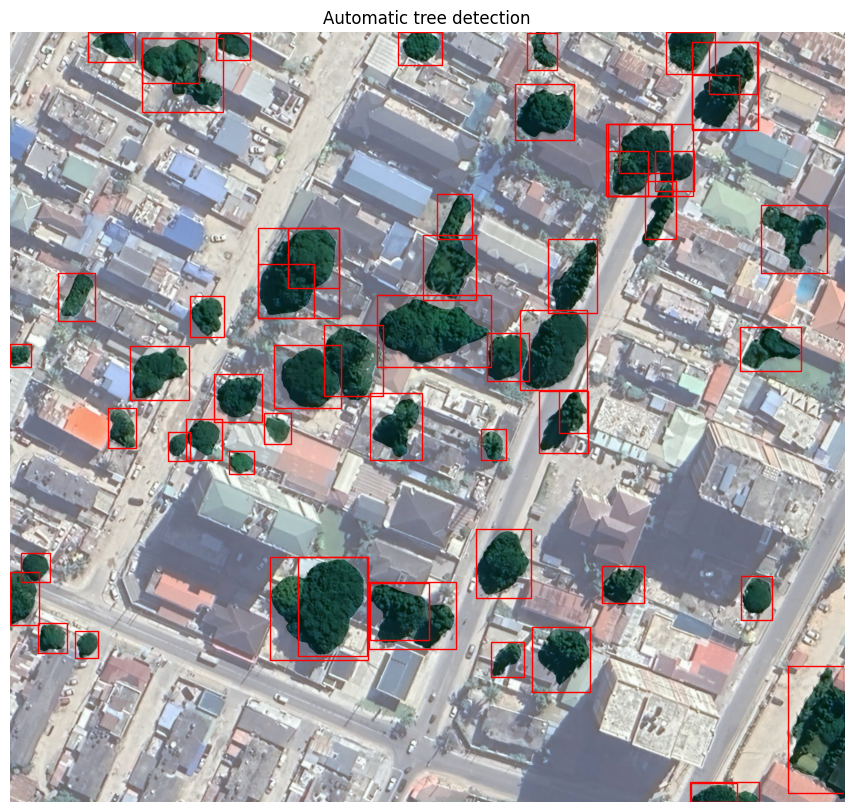

In [21]:
# Visualize the results
sam.show_anns(
    cmap='Greens',
    box_color='red',
    title='Automatic tree detection',
    blend=True,
)

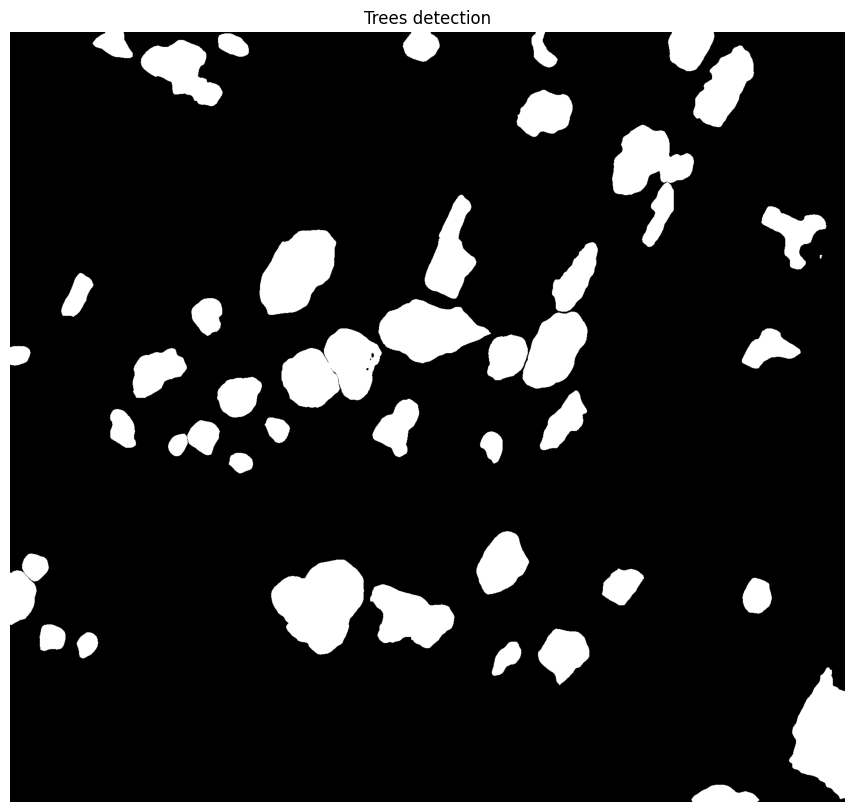

In [22]:
## Visualize and save the tree mask as greyscale
sam.show_anns(
    cmap='Greys_r',
    add_boxes=False,
    alpha=1,
    title='Trees detection',
    blend=False,
    output='trees.tif',
)

## Comparison of images with a slider


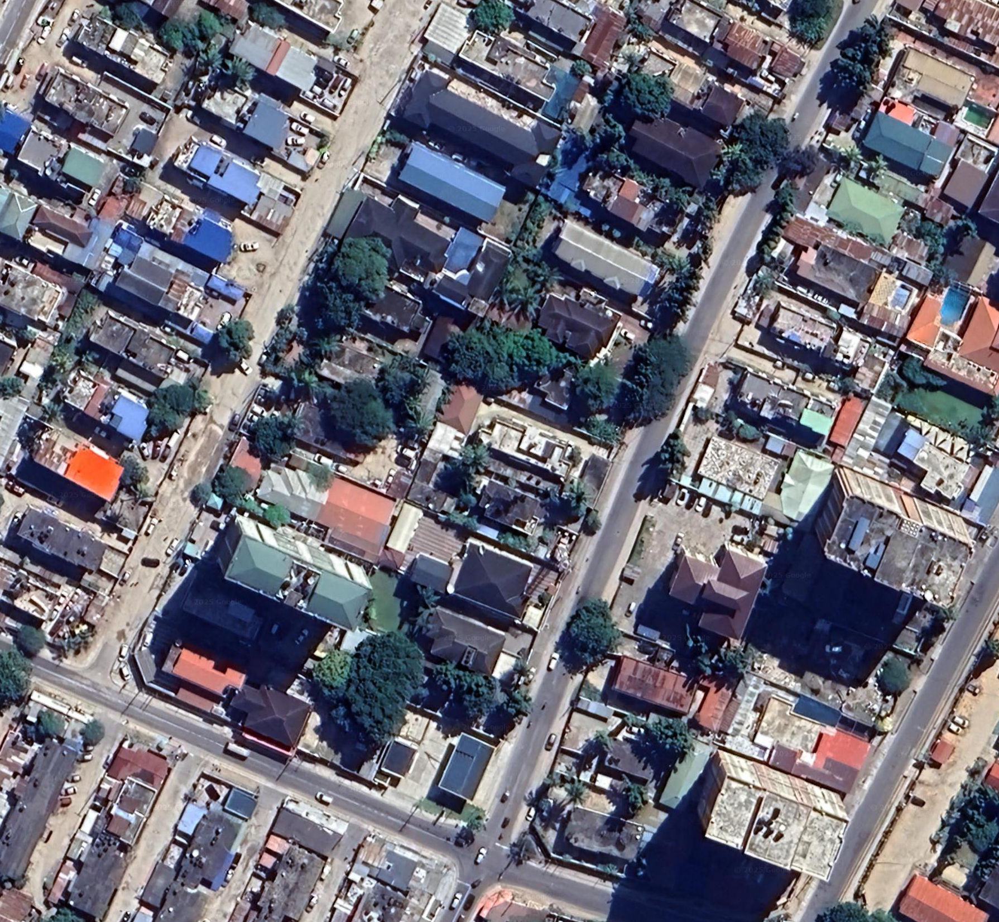
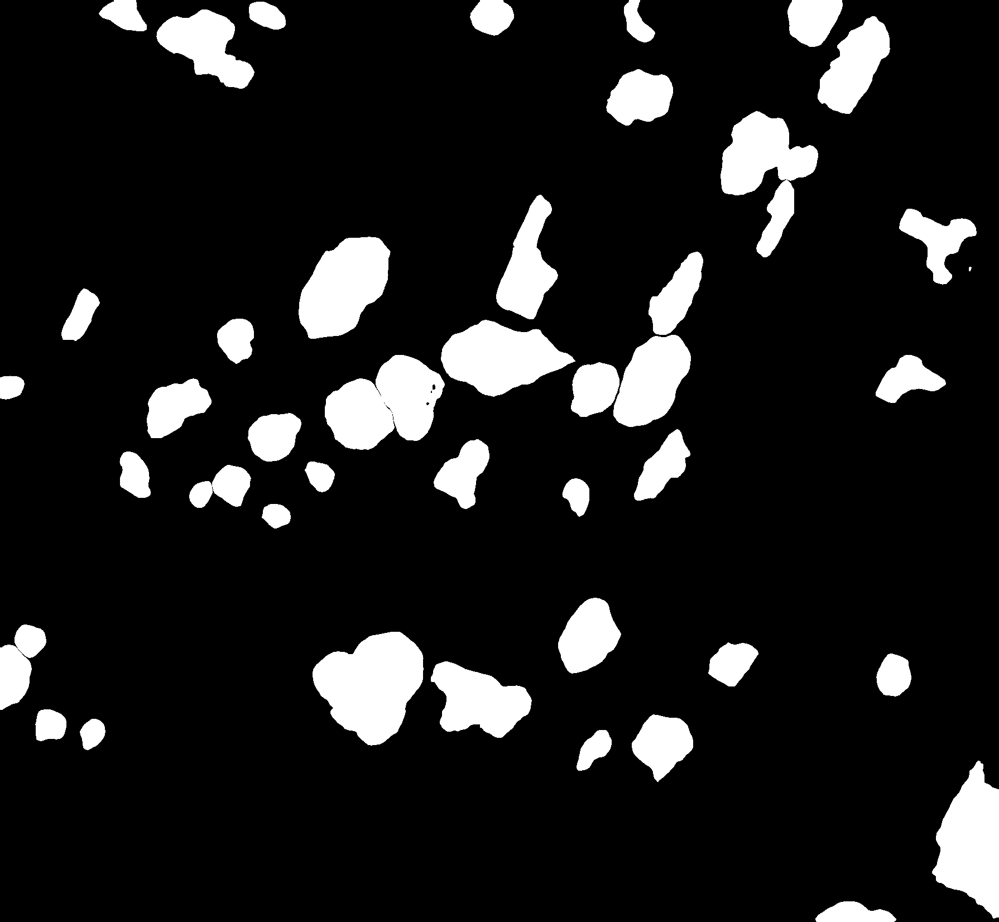

In [25]:
# Comparison map to check the efficiency of the detection
leafmap.image_comparison(
    'bimg.tiff',
    'trees.tif',
    label1='Satellite image',
    label2='Detection image',
)

### Convert the tree mask raster into a shapefile for use in QGIS for example

In [30]:
# Convert the result to a vector format, e.g., shapefile
sam.raster_to_vector("trees.tif", "tree.shp")

In [31]:
map.add_vector('tree.shp', layer_name="Trees mask")
map

Map(bottom=69654758.0, center=[-6.81169605744065, 39.27630543708802], controls=(ZoomControl(options=['position…